# Decision Tree

O começo é muito parecido com o 00_naiveBayes_insurance.

Para rodar o graphviz, foi necessario instalar o graphviz.
`sudo apt install graphviz` 

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.tree import export_graphviz
import graphviz

In [2]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']

In [3]:
from pathlib import Path
__THIS_PATH__ = Path().resolve()
__ROOT_PATH__ = __THIS_PATH__.parents[1]
__DATA_PATH__ = __ROOT_PATH__ / "data"

In [4]:
base_raw = pd.read_csv(__ROOT_PATH__/ 'data/insurance.csv')
print(base_raw.shape)
base_raw.head()

(20000, 28)


,Unnamed: 0,GoodStudent,Age,SocioEcon,RiskAversion,VehicleYear,ThisCarDam,RuggedAuto,Accident,MakeModel,...,HomeBase,AntiTheft,PropCost,OtherCarCost,OtherCar,MedCost,Cushioning,Airbag,ILiCost,DrivHist
0,1,False,Adult,Prole,Adventurous,Older,Moderate,EggShell,Mild,Economy,...,City,False,TenThou,Thousand,True,Thousand,Poor,False,Thousand,Many
1,2,False,Senior,Prole,Cautious,Current,NaN,Football,NaN,Economy,...,City,True,Thousand,Thousand,True,Thousand,Good,True,Thousand,Zero
2,3,False,Senior,UpperMiddle,Psychopath,Current,NaN,Football,NaN,FamilySedan,...,City,False,Thousand,Thousand,False,Thousand,Good,True,Thousand,One
3,4,False,Adolescent,Middle,Normal,Older,NaN,EggShell,NaN,Economy,...,Suburb,False,Thousand,Thousand,True,Thousand,Fair,False,Thousand,Zero
4,5,False,Adolescent,Prole,Normal,Older,Moderate,Football,Moderate,Economy,...,City,False,TenThou,Thousand,False,Thousand,Fair,False,Thousand,Many


In [5]:
# Removendo a coluna de nomes - Variável que não interessa na REgresssao.
base = base_raw.drop(columns = ['Unnamed: 0']).fillna("None")
print(base.shape)
base.head()

(20000, 27)


,GoodStudent,Age,SocioEcon,RiskAversion,VehicleYear,ThisCarDam,RuggedAuto,Accident,MakeModel,DrivQuality,...,HomeBase,AntiTheft,PropCost,OtherCarCost,OtherCar,MedCost,Cushioning,Airbag,ILiCost,DrivHist
0,False,Adult,Prole,Adventurous,Older,Moderate,EggShell,Mild,Economy,Poor,...,City,False,TenThou,Thousand,True,Thousand,Poor,False,Thousand,Many
1,False,Senior,Prole,Cautious,Current,None,Football,None,Economy,Normal,...,City,True,Thousand,Thousand,True,Thousand,Good,True,Thousand,Zero
2,False,Senior,UpperMiddle,Psychopath,Current,None,Football,None,FamilySedan,Excellent,...,City,False,Thousand,Thousand,False,Thousand,Good,True,Thousand,One
3,False,Adolescent,Middle,Normal,Older,None,EggShell,None,Economy,Normal,...,Suburb,False,Thousand,Thousand,True,Thousand,Fair,False,Thousand,Zero
4,False,Adolescent,Prole,Normal,Older,Moderate,Football,Moderate,Economy,Poor,...,City,False,TenThou,Thousand,False,Thousand,Fair,False,Thousand,Many


In [6]:
# variavel dependente, quero todas as linhas da coluna índice 7
y = base.iloc[:,7].values

# variáveis independentes, quero todas as linhas das outras colunas, ignorando a setima.
X = base.iloc[:,[0,1,2,3,4,5,6,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26]].values

# by FK
X0 = base.iloc[:, np.r_[0:7,8:27]].values
assert X0.all() == X.all()

In [7]:
print(set(y))
print(X[1:3])

{'Mild', 'None', 'Severe', 'Moderate'}
[[False 'Senior' 'Prole' 'Cautious' 'Current' 'None' 'Football' 'Economy'
  'Normal' 'TwentyThou' False 'Normal' True 'Thousand' False 'TenThou'
  'City' True 'Thousand' 'Thousand' True 'Thousand' 'Good' True
  'Thousand' 'Zero']
 [False 'Senior' 'UpperMiddle' 'Psychopath' 'Current' 'None' 'Football'
  'FamilySedan' 'Excellent' 'Domino' True 'Normal' False 'Thousand' False
  'TwentyThou' 'City' False 'Thousand' 'Thousand' False 'Thousand' 'Good'
  True 'Thousand' 'One']]


In [8]:
# transforma as variáveis categóricas em numéricas
labelencoder = LabelEncoder()

# codificação da categoria das variaveis
for i in range(X.shape[1]):
    if X[:,i].dtype == 'object':
        X[:,i] = labelencoder.fit_transform(X[:,i])

     

In [9]:
print("DE: ")
print(set(X0[4]))
print("\nPARA: ")
print(X[4])

DE: 
{False, 'TenThou', 'Many', 'Older', 'Moderate', 'FiftyThou', 'Fair', 'Prole', 'Adolescent', 'Economy', 'FiveThou', 'Poor', 'Thousand', 'Football', 'SubStandard', 'City', 'Normal'}

PARA: 
[0 0 1 2 1 1 1 0 2 1 0 2 0 2 0 1 0 0 2 2 0 3 1 0 3 0]


In [10]:
# X independentes
# y a variável dependente
# Tamanho do teste de 30% e então, 70% para treino
X_treinamento, X_teste, y_treinamento, y_teste = train_test_split(X,y,test_size=0.3, random_state=1)

Semelhanças com o Naive Bayes param por aqui.

In [11]:
## 92 de acuracia
# modelo = DecisionTreeClassifier(random_state=1)

## 94 de acuracia
# modelo = DecisionTreeClassifier(random_state=1, max_depth=8)

## 93 de acuracia
modelo = DecisionTreeClassifier(random_state=1, max_depth=8, max_leaf_nodes=8)

modelo.fit(X_treinamento, y_treinamento)

DecisionTreeClassifier(max_depth=8, max_leaf_nodes=8, random_state=1)

In [12]:
# gerando uma imagem da árvore de decisão
dot_data = export_graphviz(modelo, out_file=None, filled=True, 
                           feature_names=base.columns[:-1], class_names=True, 
                           rounded=True)
dot_data
graph = graphviz.Source(dot_data)
graph.render("decision_tree", format="png")
# graph.view() -> gera m pdf

'decision_tree.png'

In [13]:
previsoes = modelo.predict(X_teste)

In [14]:
accuracy = accuracy_score(y_teste, previsoes)
precision = precision_score(y_teste, previsoes, average='weighted')
recall = recall_score(y_teste, previsoes, average='weighted')
f1 = f1_score(y_teste, previsoes, average='weighted')
print(f'Acuracia: {accuracy}, Precisão: {precision}, Recall {recall}, F1: {f1}')

Acuracia: 0.9398333333333333, Precisão: 0.9389925807903848, Recall 0.9398333333333333, F1: 0.9377075487307824


In [15]:
report =  classification_report(y_teste, previsoes)
print(report)

              precision    recall  f1-score   support

        Mild       0.91      0.68      0.78       542
    Moderate       0.75      0.76      0.75       505
        None       0.97      1.00      0.99      4228
      Severe       0.89      0.93      0.91       725

    accuracy                           0.94      6000
   macro avg       0.88      0.84      0.86      6000
weighted avg       0.94      0.94      0.94      6000



# Comparativos entre os modelos

Há métodos para a poda de árvore.

Primeiro modelo


Segundo modelo (max_depth=8) - Definição da profundidade
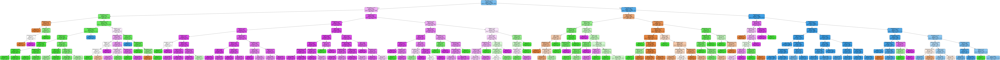

Terceiro modelo (max_depth=8, max_leaf_nodes=8) - Definição da profundidade e dos nós folha
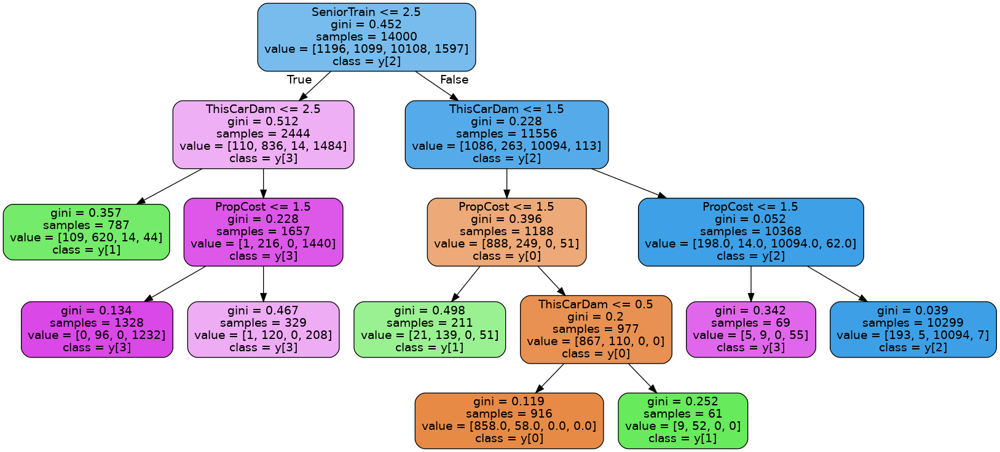